In [92]:
import os
import math
import random
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sn
import albumentations as A
import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers as tf_layers
from tensorflow.keras import models as tf_models
from tensorflow.keras import callbacks as tf_callbacks
from sklearn import metrics as sk_metrics
from sklearn import model_selection as sk_model_selection
import albumentations as A

In [93]:
import pandas as pd

BASE_DIR = "archive/"
PATH_INDEX = os.path.join(BASE_DIR, "index.csv")
PATH_TEST = os.path.join(BASE_DIR, "test.csv")
PATH_METADATA = os.path.join(BASE_DIR, "metadata.csv")

try:
    index_df = pd.read_csv(PATH_INDEX, encoding='ascii')
    print("Index DataFrame head:", index_df.head())

    test_df = pd.read_csv(PATH_TEST, encoding='ascii')
    print("Test DataFrame head:", test_df.head())

    metadata_df = pd.read_csv(PATH_METADATA, encoding='windows-1252')
    print("Metadata DataFrame head:", metadata_df.head())

except UnicodeDecodeError as e:
    print("Error decoding file:", e)


Index DataFrame head:                   path  class_id
0  marvel/0001/001.jpg         1
1  marvel/0001/002.jpg         1
2  marvel/0001/003.jpg         1
3  marvel/0001/004.jpg         1
4  marvel/0001/005.jpg         1
Test DataFrame head:            path  class_id
0  test/001.jpg        32
1  test/002.jpg        32
2  test/003.jpg        32
3  test/004.jpg        32
4  test/005.jpg         1
Metadata DataFrame head:    class_id lego_ids                 lego_names minifigure_name
0         1  [76115]  ['Spider Mech vs. Venom']      SPIDER-MAN
1         2  [76115]  ['Spider Mech vs. Venom']           VENOM
2         3  [76115]  ['Spider Mech vs. Venom']        AUNT MAY
3         4  [76115]  ['Spider Mech vs. Venom']    GHOST SPIDER
4         5  [75208]             ["Yoda's Hut"]            YODA


In [124]:
config = {
    "seed": 42,
    "valid_size": 0.3,
    "image_size": (224, 224),  
    "train_batch_size": 4,
    "valid_batch_size": 1,
    "test_batch_size": 1,
    "model": "mobilenet_v2",
    "max_epochs": 10,
    "patience_stop": 3,
    "path_to_save_model": "best.hdf5",
    "callbacks_monitor": "val_loss",
}


In [95]:
def set_seed(seed_value):
    random.seed(seed_value)
    np.random.seed(seed_value)
    tf.random.set_seed(seed_value)
    os.environ["PYTHONHASHSEED"] = str(seed_value)
    os.environ["TF_DETERMINISTIC_OPS"] = "true"
    

set_seed(config["seed"])

In [96]:
df = pd.read_csv(PATH_INDEX)

tmp_train, tmp_valid = sk_model_selection.train_test_split(
    df, 
    test_size=config["valid_size"], 
    random_state=config["seed"], 
    stratify=df['class_id'],
)


def get_paths_and_targets(tmp_df):
    paths = tmp_df["path"].values
    paths = list(map(lambda x: os.path.join(BASE_DIR, x), paths))
    targets = tmp_df["class_id"].values
    
    return paths, targets

train_paths, train_targets = get_paths_and_targets(tmp_train)

valid_paths, valid_targets = get_paths_and_targets(tmp_valid)

df_test = pd.read_csv(PATH_TEST)

test_paths, test_targets = get_paths_and_targets(df_test)

In [97]:
df_metadata = pd.read_csv(PATH_METADATA, encoding='windows-1252')


n_classes = df_metadata.shape[0]
print("Number of classes: ", n_classes)


Number of classes:  38


In [98]:
import chardet

def check_file_encoding(file_path):
    with open(file_path, 'rb') as file:
        content = file.read()
        detection = chardet.detect(content)
        print(f'{file_path} - Kodowanie: {detection["encoding"]} z ufnością {detection["confidence"]*100}%')

check_file_encoding(PATH_INDEX)
check_file_encoding(PATH_TEST)
check_file_encoding(PATH_METADATA)

archive/index.csv - Kodowanie: ascii z ufnością 100.0%
archive/test.csv - Kodowanie: ascii z ufnością 100.0%
archive/metadata.csv - Kodowanie: Windows-1252 z ufnością 73.0%


In [99]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(
        self, paths, targets, image_size=(224, 224), batch_size=64, 
        shuffle=True, transforms=None, preprocess=None,
    ):
        self.paths = paths
        self.targets = targets
        self.image_size = image_size
        self.batch_size = batch_size

        self.shuffle = shuffle

        self.transforms = transforms

        self.preprocess = preprocess
        
        self.on_epoch_end()
        
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.paths))

        if self.shuffle:
            np.random.shuffle(self.indexes)
            
    def __len__(self):
        return len(self.paths) // self.batch_size
    
    
    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]
        
        batch_paths = [self.paths[k] for k in indexes]

        batch_y = [self.targets[k] - 1 for k in indexes]
        batch_X = []
        for i in range(self.batch_size):
            img = cv2.imread(batch_paths[i])
            img = cv2.resize(img, self.image_size)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            if self.transforms:
                img = self.transforms(image=img)["image"]
            if self.preprocess:
                img = self.preprocess(img)
            
            batch_X.append(img)
            
        return np.array(batch_X), np.array(batch_y)

In [100]:


def get_train_transforms():
    return A.Compose([
        A.Resize(224, 224),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
        A.CoarseDropout(
            max_holes=100, 
            max_height=50, 
            max_width=50, 
            min_holes=10, 
            min_height=10, 
            min_width=10,
            fill_value=0,             
            p=0.5                     
        ),
        A.CoarseDropout(
            max_holes=100, 
            max_height=50, 
            max_width=50, 
            min_holes=10, 
            min_height=10, 
            min_width=10,
            fill_value=255,           
            p=0.5
        ),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(
            brightness_limit=0.2,     
            contrast_limit=0.2,       
            p=0.5                    
        ),
        A.Blur(p=0.25)                
    ], p=1.0)                          


In [101]:
def __getitem__(self, index):
    indexes = self.indexes[index * self.batch_size: (index + 1) * self.batch_size]
    batch_paths = [self.paths[k] for k in indexes]
    batch_y = [self.targets[k] for k in indexes]
    batch_X = []

    for img_path in batch_paths:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        if self.transforms:
            img = self.transforms(image=img)["image"]
        
        assert img.shape == (224, 224, 3), f"Image shape is {img.shape} but expected (224, 224, 3)"

        batch_X.append(img)

    return np.array(batch_X), np.array(batch_y)


In [102]:
train_generator = DataGenerator(
    train_paths, train_targets, batch_size=config["train_batch_size"], 
    image_size=config["image_size"], shuffle=True, 
    transforms=get_train_transforms(), preprocess=tf_mobilenet_v2.preprocess_input,
)

valid_generator = DataGenerator(
    valid_paths, valid_targets, image_size=config["image_size"],
    batch_size=config["valid_batch_size"], shuffle=False,
    preprocess=tf_mobilenet_v2.preprocess_input,
)

test_generator = DataGenerator(
    test_paths, test_targets, image_size=config["image_size"],
    batch_size=config["test_batch_size"], shuffle=False,
    preprocess=tf_mobilenet_v2.preprocess_input,
)


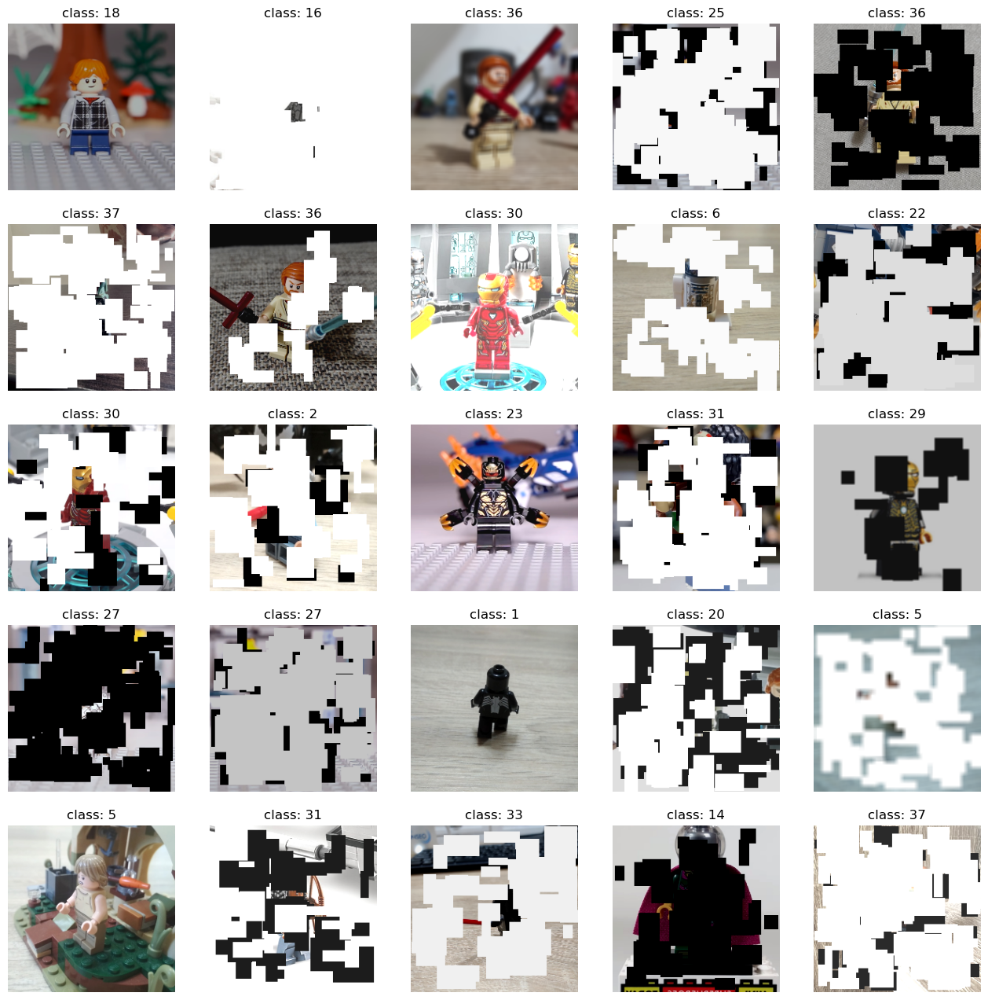

In [103]:
def denormalize_image(image):
    return ((image + 1) * 127.5).astype(int)

plt.figure(figsize=(16, 16))
ind = 0
for i_batch in range(len(train_generator)):
    images, labels = train_generator[i_batch]
    for i in range(len(images)):
        plt.subplot(5, 5, ind + 1)
        ind += 1
        plt.imshow(denormalize_image(images[i]))
        plt.title(f"class: {labels[i]}")
        plt.axis("off")
        if ind >= 25:
            break
    if ind >= 25:
        break

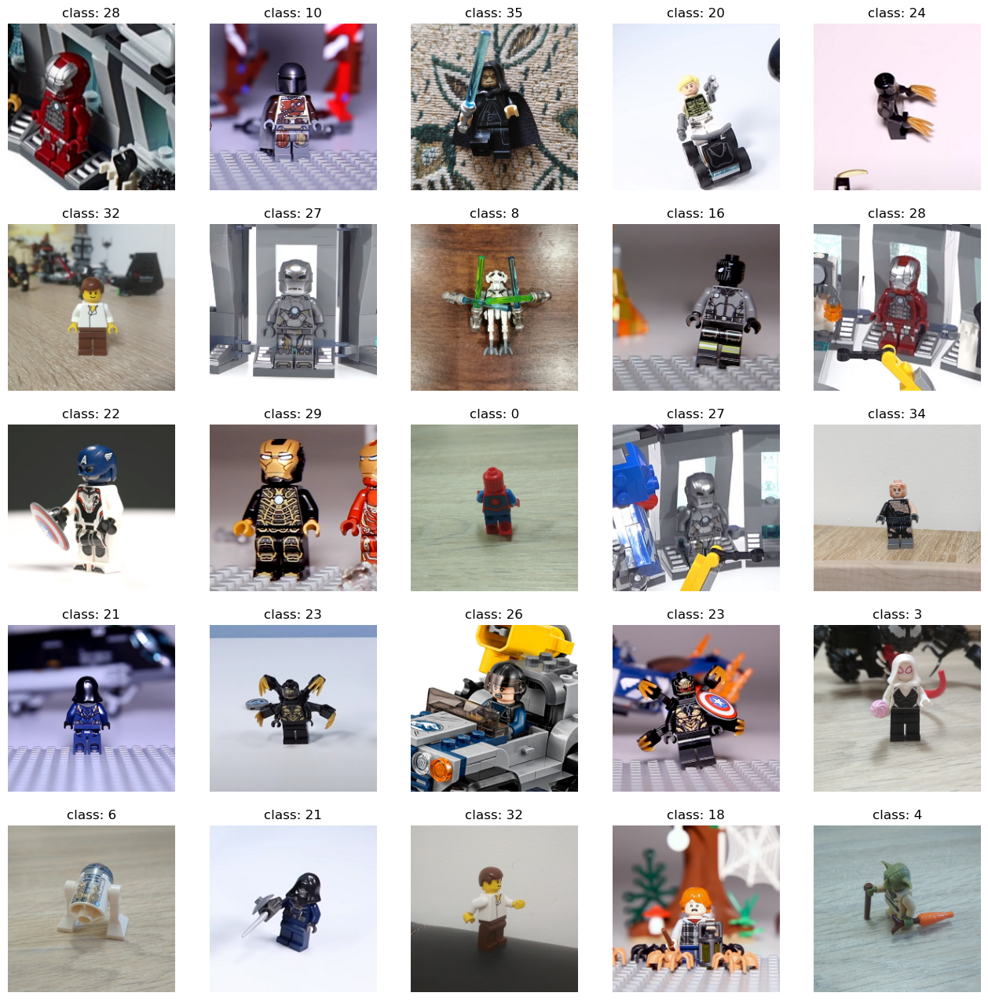

In [104]:
plt.figure(figsize=(16, 16))
ind = 0
for i_batch in range(len(valid_generator)):
    images, labels = valid_generator[i_batch]
    for i in range(len(images)):
        plt.subplot(5, 5, ind + 1)
        ind += 1
        plt.imshow(denormalize_image(images[i]))
        plt.title(f"class: {labels[i]}")
        plt.axis("off")
        if ind >= 25:
            break
    if ind >= 25:
        break

In [105]:
def init_mobilenet_v2(n_classes):
    base_model = tf_mobilenet_v2.MobileNetV2()
    x = base_model.layers[-2].output

    x = tf_layers.Dropout(.5)(x)

    outputs = tf_layers.Dense(n_classes, activation="softmax")(x)

    model = tf_models.Model(base_model.inputs, outputs)
    
    return model


def compile_model(model, optimizer, loss, metrics):
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    return model


models_constructor = {
    "mobilenet_v2": init_mobilenet_v2,
}

In [106]:
base_dir = os.path.dirname(os.path.realpath('__file__'))  
models_dir = os.path.join(base_dir, 'saved_models')  

if not os.path.exists(models_dir):
    os.makedirs(models_dir)

model_path = os.path.join(models_dir, 'best_model.keras')  

callback_save = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    monitor='val_loss',
    save_best_only=True
)

callback_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
)

In [125]:
n_classes = max(max(train_targets), max(valid_targets), max(test_targets)) + 1  
print("Updated number of classes:", n_classes)

model = MobileNetV2(input_shape=(224, 224, 3), include_top=True, weights=None, classes=n_classes)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=config["max_epochs"],
    callbacks=[callback_save, callback_early_stopping],
    verbose=1,
)

Updated number of classes: 39
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 24s 214ms/step - accuracy: 0.0356 - loss: 3.8277 - val_accuracy: 0.0268 - val_loss: 3.6628
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 12s 189ms/step - accuracy: 0.0484 - loss: 3.6889 - val_accuracy: 0.0357 - val_loss: 3.6614
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - accuracy: 0.0067 - loss: 3.6868 - val_accuracy: 0.0357 - val_loss: 3.6598


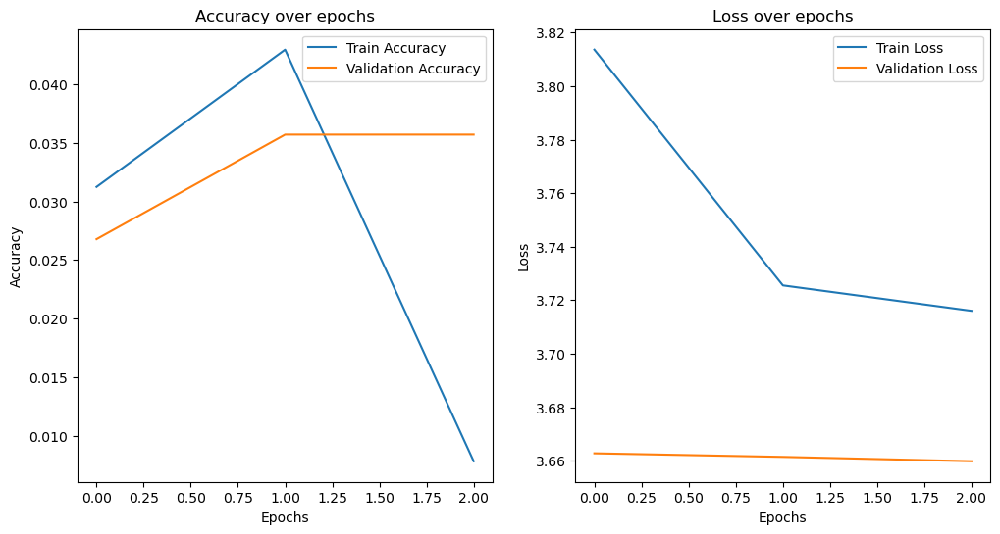

In [126]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [131]:
y_pred = []
y_test = []
for _X_test, _y_test in test_generator:
    y_pred.extend(model.predict(_X_test).argmax(axis=-1))
    y_test.extend(_y_test)

# Calculate needed metrics
print(f"Accuracy score on test data: {sk_metrics.accuracy_score(y_test, y_pred)}")
print(f"Macro F1 score on test data: {sk_metrics.f1_score(y_test, y_pred, average='macro')}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

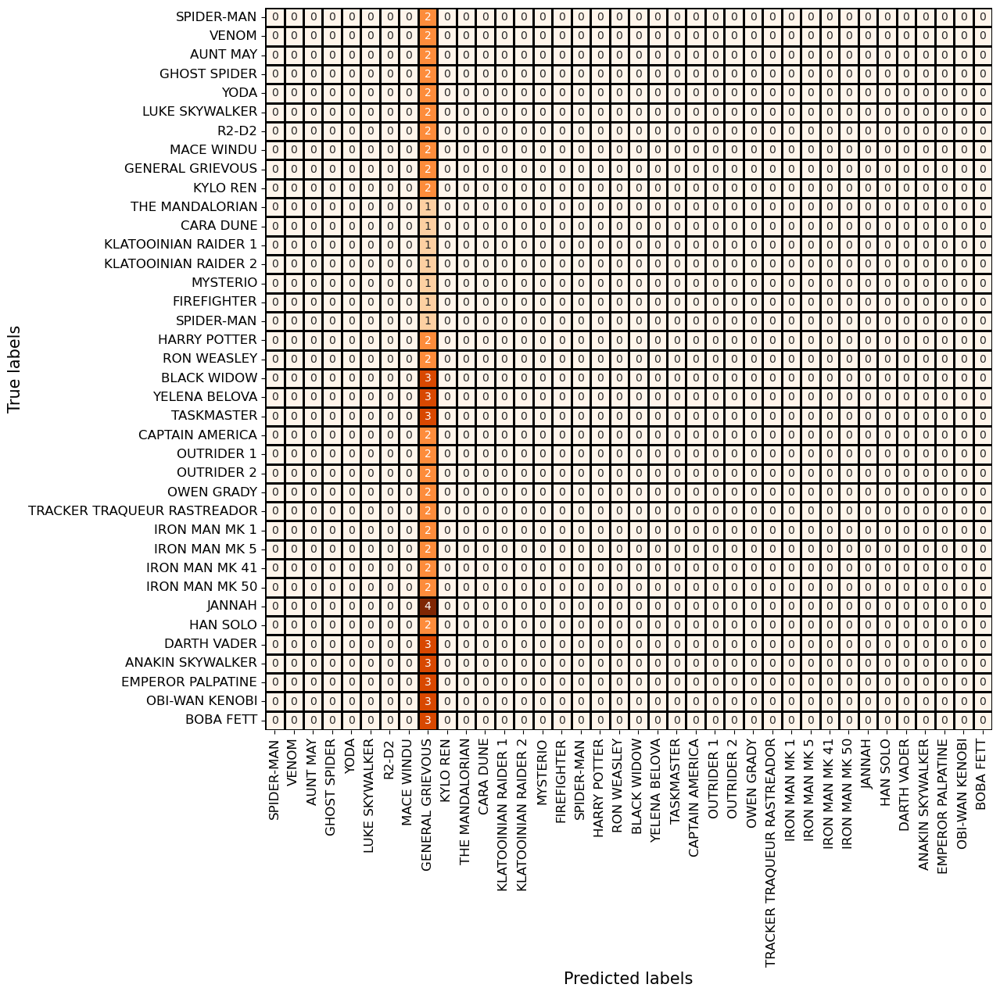

In [132]:
labels = df_metadata["minifigure_name"].tolist()

# Calculate confusion matrix
confusion_matrix = sk_metrics.confusion_matrix(y_test, y_pred)
df_confusion_matrix = pd.DataFrame(confusion_matrix, index=labels, columns=labels)

# Show confusion matrix
plt.figure(figsize=(12, 12))
sn.heatmap(df_confusion_matrix, annot=True, cbar=False, cmap="Oranges", linewidths=1, linecolor="black")
plt.xlabel("Predicted labels", fontsize=15)
plt.xticks(fontsize=12)
plt.ylabel("True labels", fontsize=15)
plt.yticks(fontsize=12);

In [133]:
error_images = []
error_label = []
error_pred = []
error_prob = []
for _X_test, _y_test in test_generator:
    pred = model.predict(_X_test).argmax(axis=-1)
    if pred[0] != _y_test:
        error_images.extend(_X_test)
        error_label.extend(_y_test)
        error_pred.extend(pred)
        error_prob.extend(model.predict(_X_test).max(axis=-1))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

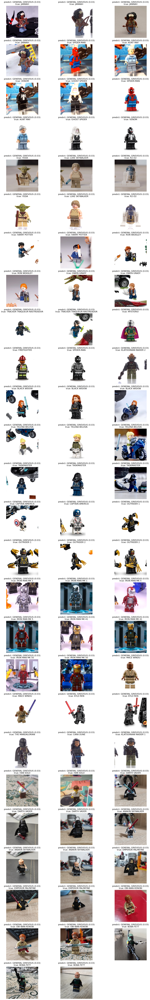

In [134]:
w_size = 3
h_size = math.ceil(len(error_images) / w_size)
plt.figure(figsize=(16, h_size * 4))
for ind, image in enumerate(error_images):
    plt.subplot(h_size, w_size, ind + 1)
    plt.imshow(denormalize_image(image))
    pred_label = labels[error_pred[ind]]
    pred_prob = error_prob[ind]
    true_label = labels[error_label[ind]]
    plt.title(f"predict: {pred_label} ({pred_prob:.2f})\ntrue: {true_label}", fontsize=12)
    plt.axis("off")